Geoinformatik 2 – GIS-Analyse
# **Übung 3** · Punktmusteranalyse
Prof. Dr. Yu Feng

## Lernziele
Nach dieser Übung können Sie:
- 
- 
- 

## Datensatz - Tokyo Flickr Fotos

**Datensatz-Übersicht:**
- **Quelle**: Geomarkierte Fotos von [Flickr](https://www.flickr.com/) (100m Flickr Datensatz)
- **Standort**: Metropolregion Tokio
- **Punkte**: 10.000 georeferenzierte Fotokoordinaten
- **Forschungsfragen**: Wo machen Menschen Fotos? Welche Muster entstehen in der Fotoverteilung?

## Erforderliche Abhängigkeiten

Die folgende Übung erfordert diese Python-Pakete. Falls nicht installiert, bitte die folgenden Befehle ausführen:

In [129]:
#!pip install geopandas
#!pip install pysal
#!pip install contextily
#!pip install pygeos

In [130]:
import numpy
import pandas
import geopandas
import pysal
import seaborn
import contextily
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

## Punktdaten einladen

Wir laden Daten über Fotostandorte von Flickr.Die Tabelle enthält Informationen über 10.000 Fotografien:

- Benutzer-ID (wer das Foto gemacht hat)- URL des Fotos
- Geografische Koordinaten (Breite und Länge)- Zeitstempel (wann das Foto gemacht wurde)
- Transformierte Koordinaten (Pseudo-Mercator-Projektion)



In [138]:
db = pandas.read_csv("tokyo_clean.csv")
db.head()

,user_id,longitude,latitude,date_taken,photo/video_page_url,x,y
0,10727420@N00,139.700499,35.674000,2010-04-09 17:26:25.0,http://www.flickr.com/photos/10727420@N00/4545...,1.555139e+07,4.255856e+06
1,8819274@N04,139.766521,35.709095,2007-02-10 16:08:40.0,http://www.flickr.com/photos/8819274@N04/26503...,1.555874e+07,4.260667e+06
2,62068690@N00,139.765632,35.694482,2008-12-21 15:45:31.0,http://www.flickr.com/photos/62068690@N00/3125...,1.555864e+07,4.258664e+06
3,49503094041@N01,139.784391,35.548589,2011-11-11 05:48:54.0,http://www.flickr.com/photos/49503094041@N01/6...,1.556073e+07,4.238684e+06
4,40443199@N00,139.768753,35.671521,2006-04-06 16:42:49.0,http://www.flickr.com/photos/40443199@N00/2482...,1.555899e+07,4.255517e+06


In [ ]:
import geopandas as gpd
from shapely.geometry import Point

# Convert to GeoDataFrame (Web Mercator: EPSG:3857)
geometry = [Point(xy) for xy in zip(db['x'], db['y'])]
gdf = gpd.GeoDataFrame(db, geometry=geometry, crs='EPSG:3857')
gdf.explore()

## Visualizing point patterns

There are many ways to visualize geographic point patterns, and the choice of method depends on the intended message.

### Showing patterns as dots on a map

The first step to get a sense of what the spatial dimension of this dataset looks like is to plot it. At its most basic level, we can generate a scatterplot with `seaborn` in Figure 1:


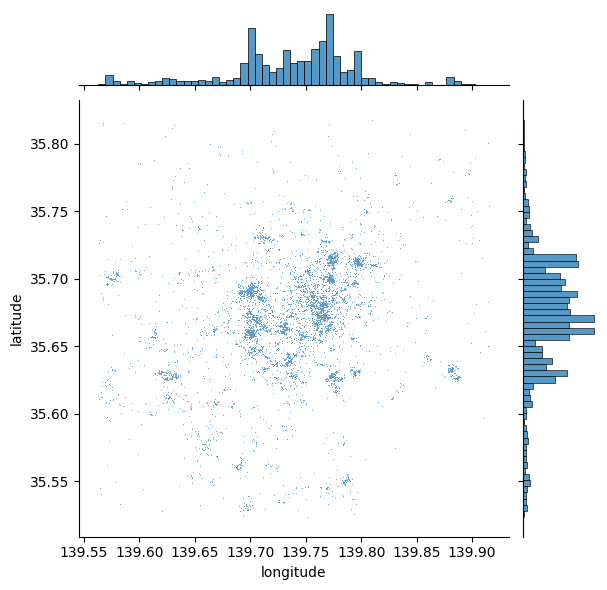

In [56]:
# Generate scatter plot
seaborn.jointplot(x="longitude", y="latitude", data=db, s=0.5);

This is a good start: we can see dots tend to be concentrated in the center of the covered area in a non-random pattern. Furthermore, within the broad pattern, we can also see there seems to be more localized clusters. However, the plot above has two key drawbacks: one, it lacks geographical context; and two, there are areas where the density of points is so large that it is hard to tell anything beyond a blue blurb.

Start with the context. The easiest way to provide additional context is by overlaying a tile map from the internet. Let us quickly call `contextily` for that, and integrate it with `jointplot` to create Figure 2:

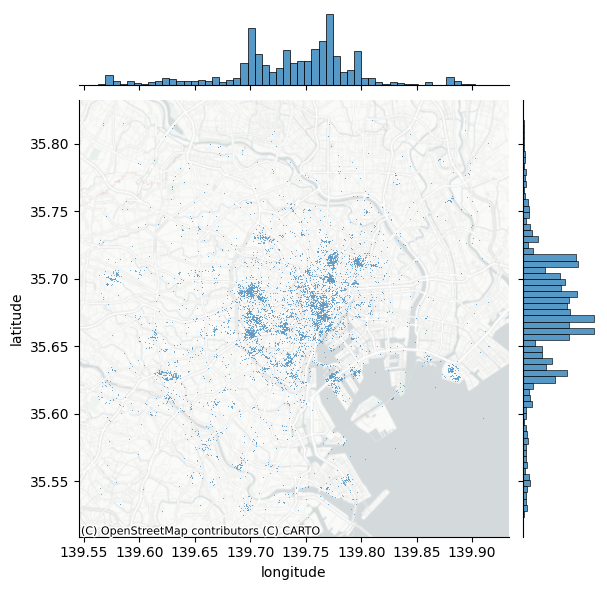

In [57]:
# Generate scatter plot
joint_axes = seaborn.jointplot(
    x="longitude", y="latitude", data=db, s=0.5
)
contextily.add_basemap(
    joint_axes.ax_joint,
    crs="EPSG:4326",
    source=contextily.providers.CartoDB.PositronNoLabels,
);

Note how we can pull out the axis where the points are plotted and add the basemap there, specifying the CRS as WGS84, since we are plotting longitude and latitude. Compared to the previous plot, adding a basemap to our initial plot makes the pattern of Flickr data clearer.

### Showing density with hexbinning

Consider our second problem: cluttering. When too many photos are concentrated in some areas, plotting opaque dots on top of one another can make it hard to discern any pattern and explore its nature. For example, in the middle of the map in Figure 3, toward the right, there appears to be the highest concentration of pictures taken; the sheer amount of dots on the maps in some parts obscures whether all of that area receives as many pics or whether, within there, some places receive a particularly high degree of attention.

One solution to get around cluttering relates to what we referred to earlier as moving from {ref}`"tables to surfaces" <ch03-surfaces_as_tables>`. We can now recast this approach as a *spatial* or *two-dimensional histogram*. Here, we generate a regular grid (either squared or hexagonal), count how many dots fall within each grid cell, and present it as we would any other choropleth. This is attractive because it is simple, intuitive and, if fine enough, the regular grid removes some of the area distortions choropleth maps may induce. For this illustration, let us use use hexagonal binning (sometimes called hexbin) because it has slightly nicer properties than squared grids, such as less shape distortion and more regular connectivity between cells. Creating a hexbin two-dimensional histogram is straightforward in Python using the `hexbin` function to create Figure 3:


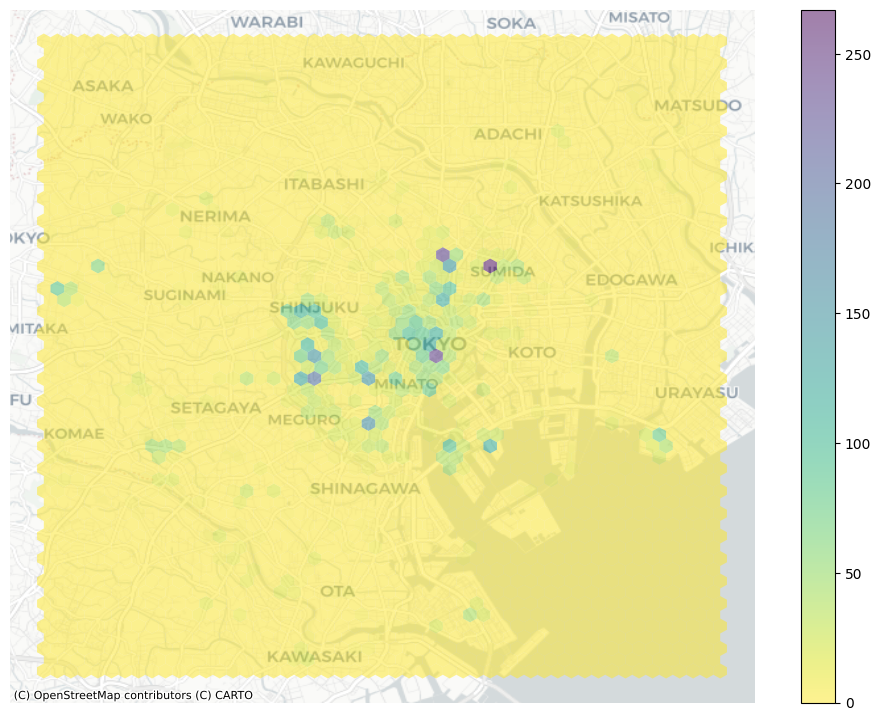

In [58]:
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(12, 9))
# Generate and add hexbin with 50 hexagons in each
# dimension, no borderlines, half transparency,
# and the reverse viridis colormap
hb = ax.hexbin(
    db["x"],
    db["y"],
    gridsize=50,
    linewidths=0,
    alpha=0.5,
    cmap="viridis_r",
)
# Add basemap
contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
# Add colorbar
plt.colorbar(hb)
# Remove axes
ax.set_axis_off()

Voila, this allows a lot more detail! It is now clear that the majority of photographs relate to much more localized areas, and that the previous map was obscuring this.

### Another kind of density: kernel density estimation

Grids are the spatial equivalent of a histogram: the user decides how many "buckets", and the points are counted within them in a discrete fashion. This is fast, efficient, and potentially very detailed (if many bins are created). However, it does represent a discretization of an essentially contiguous phenomenon and, as such, it may introduce distortions (e.g., the modifiable areal unit problem {cite}`wong2004`). An alternative approach is to instead create what is known as a kernel density estimation (KDE): an empirical approximation of the probability density function. This approach is covered in detail elsewhere (e.g., {cite}`Silverman1986density`), but we can provide the intuition here. Instead of overlaying a grid of squares of hexagons and count how many points fall within each, a KDE lays a grid of points over the space of interest on which it places kernel functions that count points around them with a different weight based on the distance. These counts are then aggregated to generate a global surface with probability. The most common kernel function is the Gaussian one, which applies a normal distribution to weight points. The result is a continuous surface with a probability function that may be evaluated at every point. Creating a Gaussian kernel map in Python is rather straightforward, using the `seaborn.kdeplot()` function to create Figure 4:

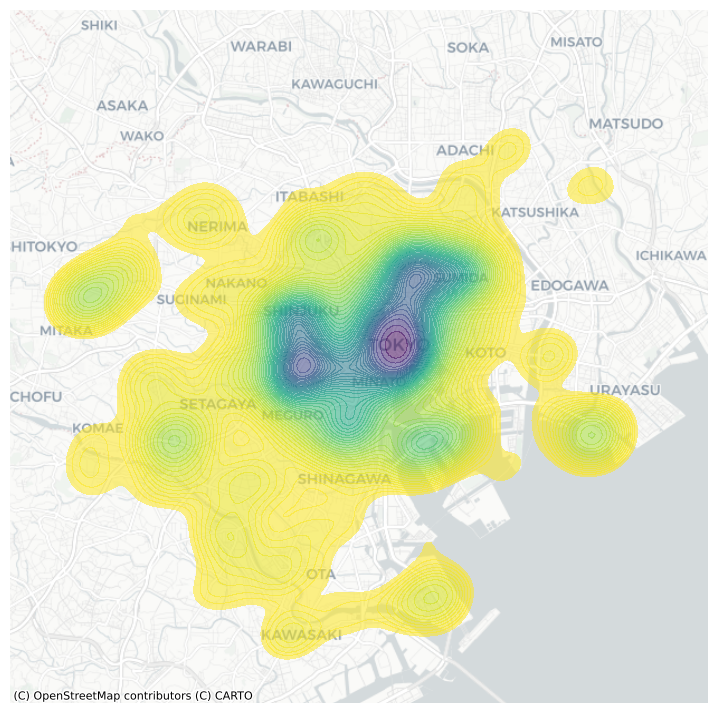

In [59]:
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Generate and add KDE with a shading of 50 gradients
# coloured contours, 75% of transparency,
# and the reverse viridis colormap
seaborn.kdeplot(
    x="x",
    y="y",
    data=db,
    n_levels=50,
    shade=True,
    alpha=0.55,
    cmap="viridis_r",
)
# Add basemap
contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
# Remove axes
ax.set_axis_off()

The result is a smoother output that captures the same structure of the hexbin but "eases" the transitions between different areas. This provides a better generalization of the theoretical probability distribution over space.  Technically, the continuous nature of the KDE function implies that for any given point the probability of an event is 0. However, as the area around a point increases, the probability of an event within that area can be obtained.  This is useful in some cases, but it is mainly of use to escape the restrictions imposed by a regular grid of hexagons or squares.

## Centrography

Centrography is the analysis of centrality in a point pattern. By "centrality," we mean the general location and dispersion of the pattern. If the hexbin above can be seen as a "spatial histogram", centrography is the point pattern equivalent of measures of central tendency such as the mean. These measures are useful because they allow us to summarize spatial distributions in smaller sets of information (e.g., a single point). Many different indices are used in centrography to provide an indication of "where" a point pattern is, how tightly the point pattern clusters around its center, or how irregular its shape is.


### Tendency

A common measure of central tendency for a point pattern is its *center of mass*. For marked point patterns, the center of mass identifies a central point close to observations that have higher values in their marked attribute. For unmarked point patterns, the center of mass is equivalent to the *mean center*, or average of the coordinate values. In addition, the *median center* is analogous to the *median* elsewhere, and represents a point where half of the data is above or below the point and half is to its left or right. We can analyze the mean center with our Flickr point pattern using the `pointpats` package in Python.


In [60]:
from pointpats import centrography

In [61]:
mean_center = centrography.mean_center(db[["x", "y"]])
med_center = centrography.euclidean_median(db[["x", "y"]])

It is easiest to visualize this by plotting the point pattern and its mean center alongside one another, as done to create Figure 5:

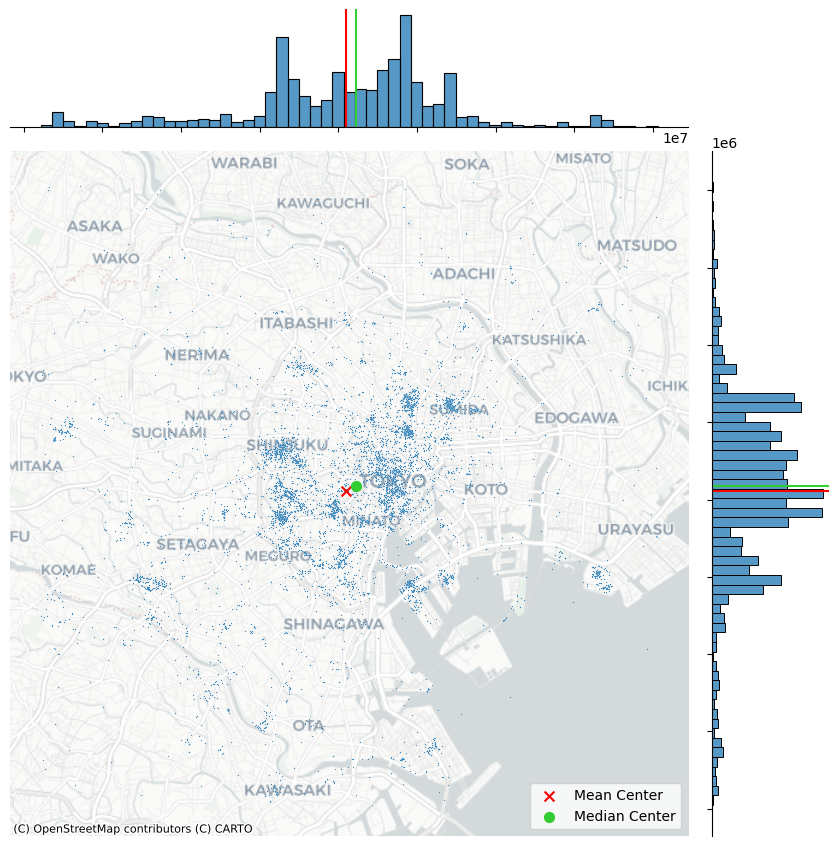

In [62]:
# Generate scatterplot
joint_axes = seaborn.jointplot(
    x="x", y="y", data=db, s=0.75, height=9
)
# Add mean point and marginal lines
joint_axes.ax_joint.scatter(
    *mean_center, color="red", marker="x", s=50, label="Mean Center"
)
joint_axes.ax_marg_x.axvline(mean_center[0], color="red")
joint_axes.ax_marg_y.axhline(mean_center[1], color="red")
# Add median point and marginal lines
joint_axes.ax_joint.scatter(
    *med_center,
    color="limegreen",
    marker="o",
    s=50,
    label="Median Center"
)
joint_axes.ax_marg_x.axvline(med_center[0], color="limegreen")
joint_axes.ax_marg_y.axhline(med_center[1], color="limegreen")
# Legend
joint_axes.ax_joint.legend()
# Add basemap
contextily.add_basemap(
    joint_axes.ax_joint, source=contextily.providers.CartoDB.Positron
)
# Clean axes
joint_axes.ax_joint.set_axis_off()
# Display
plt.show()

The discrepancy between the two centers is caused by the skew; there are many "clusters" of pictures far out in West and South Tokyo, whereas North and East Tokyo is densely packed, but drops off very quickly. Thus, the far out clusters of pictures pulls the mean center to the west and south, relative to the median center.


### Dispersion

A measure of dispersion that is common in centrography is the *standard distance*. This measure provides the average distance away from the center of the point cloud (such as measured by the center of mass). This is also simple to compute using `pointpats`, using the `std_distance` function:


In [63]:
centrography.std_distance(db[["x", "y"]])

8778.218564382098

This means that, on average, pictures are taken around 8800 meters away from the mean center.

Another helpful visualization is the *standard deviational ellipse*, or *standard ellipse*. This is an ellipse drawn from the data that reflects its center, dispersion, and orientation. To visualize this, we first compute the axes and rotation using the `ellipse` function in `pointpats`:

In [64]:
major, minor, rotation = centrography.ellipse(db[["x", "y"]])

Then, we will visualize this in Figure 6:

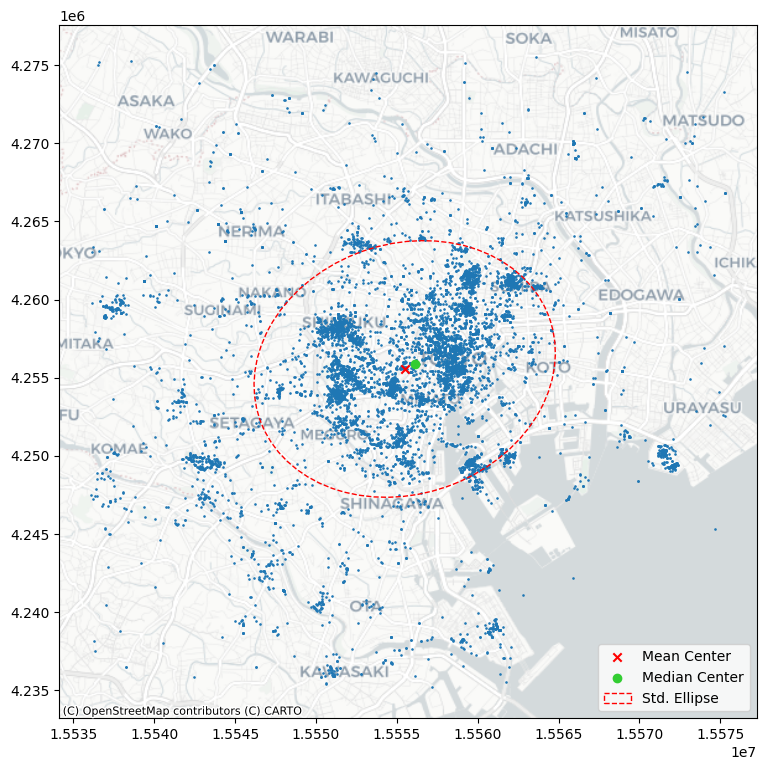

In [65]:
from matplotlib.patches import Ellipse

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Plot photograph points
ax.scatter(db["x"], db["y"], s=0.75)
ax.scatter(*mean_center, color="red", marker="x", label="Mean Center")
ax.scatter(
    *med_center, color="limegreen", marker="o", label="Median Center"
)

# Construct the standard ellipse using matplotlib
ellipse = Ellipse(
    xy=mean_center,  # center the ellipse on our mean center
    width=major * 2,  # centrography.ellipse only gives half the axis
    height=minor * 2,
    angle=numpy.rad2deg(
        rotation
    ),  # Angles for this are in degrees, not radians
    facecolor="none",
    edgecolor="red",
    linestyle="--",
    label="Std. Ellipse",
)
ax.add_patch(ellipse)

ax.legend()
# Display
# Add basemap
contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
plt.show()

In [78]:
random_pattern = random.poisson(coordinates, size=len(coordinates))

You can visualize this using the same methods as before, which we show in Figure 9:

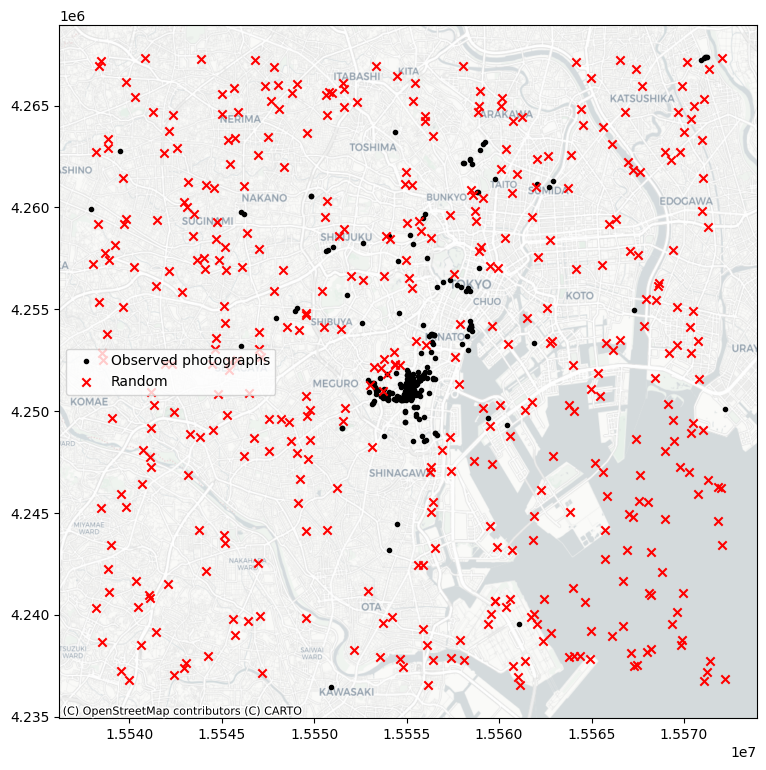

In [79]:
f, ax = plt.subplots(1, figsize=(9, 9))
plt.scatter(
    *coordinates.T,
    color="k",
    marker=".",
    label="Observed photographs"
)
plt.scatter(*random_pattern.T, color="r", marker="x", label="Random")
contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
ax.legend(ncol=1, loc="center left")
plt.show()

As you can see, the simulation (by default) works with the bounding box of the input point pattern. To simulate from more restricted areas formed by the point pattern, pass those hulls to the simulator! For example, to generate a random pattern within the alpha shapes:

In [80]:
random_pattern_ashape = random.poisson(
    alpha_shape, size=len(coordinates)
)

### Comparing three spatial patterns: Clustered vs. Intermediate vs. Random

To better understand how Ripley's functions respond to different spatial patterns, let's generate an intermediate pattern that exhibits moderate clustering. This pattern will serve as a bridge between the observed clustered pattern and the completely random CSR pattern.


In [107]:
# Generate intermediate pattern: cluster process
# Create cluster centers randomly, then add points around them
numpy.random.seed(42)
n_clusters = 15  # Number of clusters
points_per_cluster = len(coordinates) // n_clusters
cluster_radius = 1500  # Standard deviation for point distribution around centers

# Create random cluster centers within the bounding box
bbox = numpy.array([[coordinates[:, 0].min(), coordinates[:, 0].max()],
                     [coordinates[:, 1].min(), coordinates[:, 1].max()]])
cluster_centers = numpy.random.uniform(
    [bbox[0, 0], bbox[1, 0]], 
    [bbox[0, 1], bbox[1, 1]], 
    size=(n_clusters, 2)
)

# Generate points around each cluster center
intermediate_pattern = []
for center in cluster_centers:
    cluster_points = center + numpy.random.normal(
        0, cluster_radius, size=(points_per_cluster, 2)
    )
    intermediate_pattern.extend(cluster_points)

intermediate_pattern = numpy.array(intermediate_pattern)
print(f"Generated intermediate pattern with {len(intermediate_pattern)} points")

Generated intermediate pattern with 405 points


We can visualize this in Figure 10:

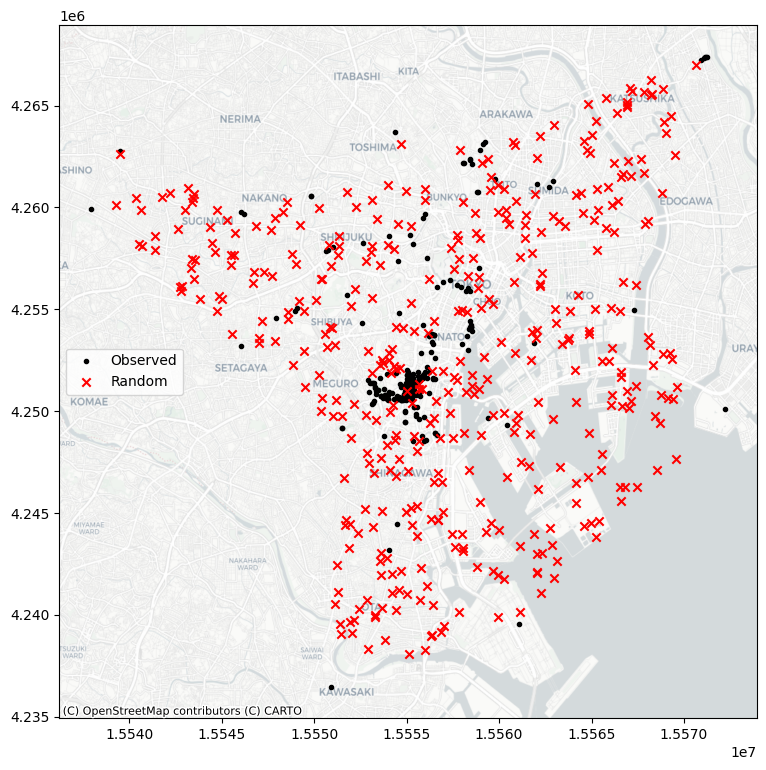

In [81]:
f, ax = plt.subplots(1, figsize=(9, 9))
plt.scatter(*coordinates.T, color="k", marker=".", label="Observed")
plt.scatter(
    *random_pattern_ashape.T, color="r", marker="x", label="Random"
)
contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
ax.legend(ncol=1, loc="center left")
plt.show()

### Ripley's alphabet of functions

The second group of spatial statistics we consider focuses on the distributions of two quantities in a point pattern: nearest neighbor distances and what we will term "gaps" in the pattern. They derive from seminal work by {cite}`Ripley1991` on how to characterize clustering or co-location in point patterns. Each of these characterizes an aspect of the point pattern as we increase the distance range from each point to calculate them.

The first function, Ripley's $G$, focuses on the distribution of nearest neighbor distances. That is, the $G$ function summarizes the distances between each point in the pattern and its nearest neighbor. In Figure 14, this nearest neighbor logic is visualized with the red dots being a detailed view of the point pattern and the black arrows indicating the nearest neighbor to each point. Note that sometimes two points are *mutual* nearest neighbors (and so have arrows going in both directions), but some are not.


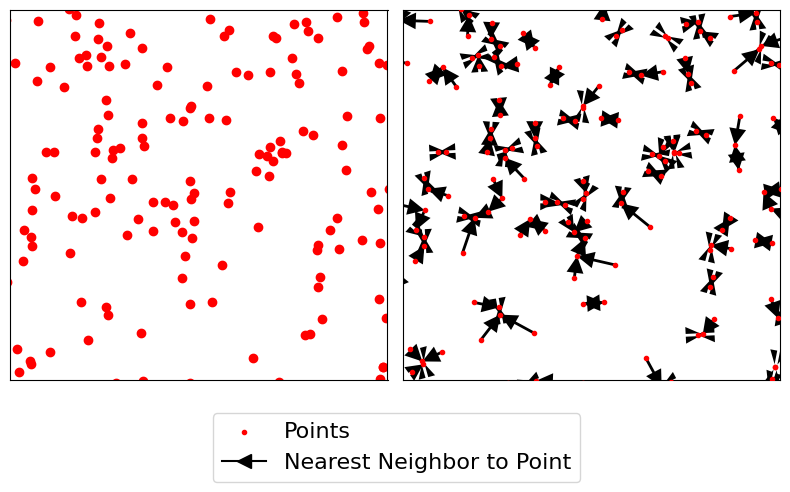

In [104]:
# Code generated for this figure is available on the web version of the book.
f, ax = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)
ax[0].scatter(*random_pattern.T, color="red")
ax[1].scatter(
    *random_pattern.T,
    color="red",
    zorder=100,
    marker=".",
    label="Points"
)
nn_ixs, nn_ds = PointPattern(random_pattern).knn(1)
first = True
for coord, nn_ix, nn_d in zip(random_pattern, nn_ixs, nn_ds):
    dx, dy = random_pattern[nn_ix].squeeze() - coord
    arrow = ax[1].arrow(
        *coord,
        dx,
        dy,
        length_includes_head=True,
        overhang=0,
        head_length=300 * 3,
        head_width=300 * 3,
        width=50 * 3,
        linewidth=0,
        facecolor="k",
        head_starts_at_zero=False
    )
    if first:
        plt.plot(
            (1e100, 1e101),
            (0, 1),
            color="k",
            marker="<",
            markersize=10,
            label="Nearest Neighbor to Point",
        )
    first = False

ax[0].axis([1.554e7, 1.556e7, 4240000, 4260000])
ax[0].set_xticklabels([])
ax[0].set_yticklabels([])
ax[0].set_xticks([])
ax[0].set_yticks([])
f.tight_layout()
ax[1].legend(bbox_to_anchor=(0.5, -0.06), fontsize=16)
plt.show()

Ripley's $G$ keeps track of the proportion of points for which the nearest neighbor is within a given distance threshold, and plots that cumulative percentage against the increasing distance radii. The distribution of these cumulative percentages has a distinctive shape under completely spatially random processes. The intuition behind Ripley's G goes as follows: we can learn about how similar our pattern is to a spatially random one by computing the cumulative distribution of nearest neighbor distances over increasing distance thresholds, and comparing it to that of a set of simulated patterns that follow a known spatially random process. Usually, a spatial Poisson point process is used as such reference distribution.

To do this in the `pointpats` package, we can use the `g_test` function, which computes both the `G` function for the empirical data *and* these hypothetical replications under a completely spatially random process.


In [105]:
g_test = distance_statistics.g_test(
    coordinates, support=40, keep_simulations=True
)

Thinking about these distributions of distances, a "clustered" pattern must have more points near one another than a pattern that is "dispersed"; and a completely random pattern should have something in between. Therefore, if the $G$ function increases *rapidly* with distance, we probably have a clustered pattern. If it increases *slowly* with distance, we have a dispersed pattern. Something in the middle will be difficult to distinguish from pure chance.

We can visualize this in Figure 15. On the left, we plot the $G(d)$ function, with distance-to-point ($d$) on the horizontal axis and the fraction of nearest neighbor distances smaller than $d$ on the right axis. The empirical cumulative distribution of nearest neighbor distances is shown in red. In blue, simulations (like the `random` pattern shown in the previous section) are shown. The bright blue line represents the average of all simulations, and the darker blue/black band around it represents the middle 95% of simulations.

In Figure 15, we see that the red empirical function rises much faster than simulated completely spatially random patterns. This means that the observed pattern of this user's Flickr photographs are *closer* to their nearest neighbors than would be expected from a completely spatially random pattern. The pattern is *clustered.*


#### Comparing G function across three patterns

Now let's compute the G function for all three patterns and compare them on the same plot:


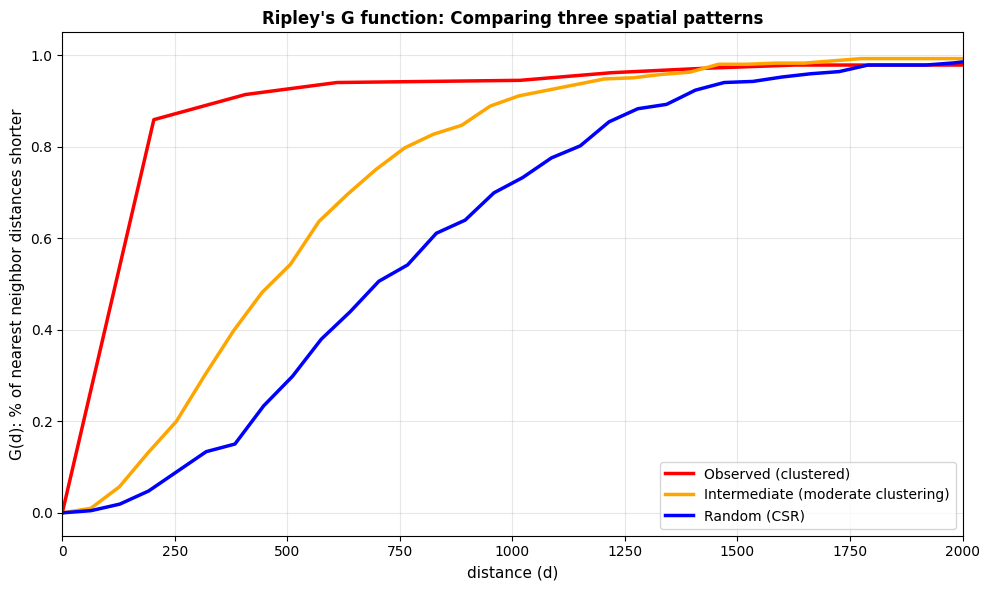

Pattern characteristics:
  Observed (clustered): G rises very steeply - many nearby neighbors
  Intermediate: G rises moderately - some clustering tendency
  Random (CSR): G rises gradually - even spatial distribution


In [111]:
# Compute G function for all three patterns
g_observed = distance_statistics.g_test(
    coordinates, support=40, keep_simulations=False
)
g_intermediate = distance_statistics.g_test(
    intermediate_pattern, support=40, keep_simulations=False
)
g_random = distance_statistics.g_test(
    random_pattern, support=40, keep_simulations=False
)

# Create comparison plot
f, ax = plt.subplots(1, 1, figsize=(10, 6))

# Plot all three G functions
ax.plot(g_observed.support, g_observed.statistic, 
        label="Observed (clustered)", color="red", linewidth=2.5)
ax.plot(g_intermediate.support, g_intermediate.statistic,
        label="Intermediate (moderate clustering)", color="orange", linewidth=2.5)
ax.plot(g_random.support, g_random.statistic,
        label="Random (CSR)", color="blue", linewidth=2.5)

ax.set_xlabel("distance (d)", fontsize=11)
ax.set_ylabel("G(d): % of nearest neighbor distances shorter", fontsize=11)
ax.set_title("Ripley's G function: Comparing three spatial patterns", fontsize=12, fontweight='bold')
ax.legend(fontsize=10, loc='lower right')
ax.set_xlim(0, 2000)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("Pattern characteristics:")
print(f"  Observed (clustered): G rises very steeply - many nearby neighbors")
print(f"  Intermediate: G rises moderately - some clustering tendency")
print(f"  Random (CSR): G rises gradually - even spatial distribution")

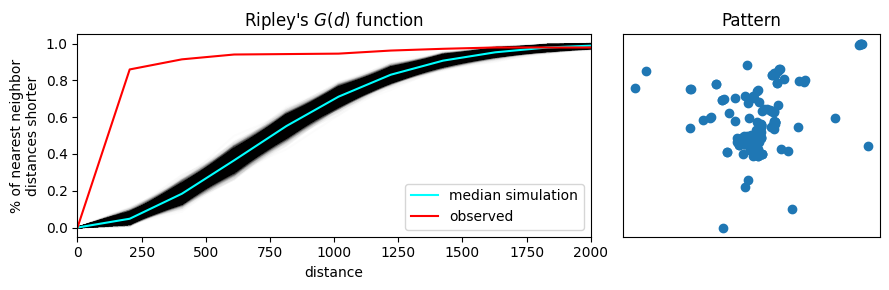

In [90]:
f, ax = plt.subplots(
    1, 2, figsize=(9, 3), gridspec_kw=dict(width_ratios=(6, 3))
)
# plot all the simulations with very fine lines
ax[0].plot(
    g_test.support, g_test.simulations.T, color="k", alpha=0.01
)
# and show the average of simulations
ax[0].plot(
    g_test.support,
    numpy.median(g_test.simulations, axis=0),
    color="cyan",
    label="median simulation",
)


# and the observed pattern's G function
ax[0].plot(
    g_test.support, g_test.statistic, label="observed", color="red"
)

# clean up labels and axes
ax[0].set_xlabel("distance")
ax[0].set_ylabel("% of nearest neighbor\ndistances shorter")
ax[0].legend()
ax[0].set_xlim(0, 2000)
ax[0].set_title(r"Ripley's $G(d)$ function")

# plot the pattern itself on the next frame
ax[1].scatter(*coordinates.T)

# and clean up labels and axes there, too
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_xticklabels([])
ax[1].set_yticklabels([])
ax[1].set_title("Pattern")
f.tight_layout()
plt.show()

The second function we introduce is Ripley's $F$. Where the $G$ function works by analyzing the distance *between* points in the pattern, the *F* function works by analyzing the distance *to* points in the pattern from locations in empty space. That is why the $F$ function is called the "the empty space function", since it characterizes the typical distance from arbitrary points in empty space to the point pattern. More explicitly, the $F$ accumulates, for a growing distance range, the percentage of points that can be found within that range from a random point pattern generated within the extent of the observed pattern. If the pattern has large gaps or empty areas, the $F$ function will increase slowly. But, if the pattern is highly dispersed, then the $F$ function will increase rapidly. The shape of this cumulative distribution is then compared to those constructed by calculating the same cumulative distribution between the random pattern and an additional, random one generated in each simulation step.

We can use similar tooling to investigate the $F$ function, since it is so mathematically similar to the $G$ function. This is implemented identically using the `f_test` function in `pointpats`. Since the $F$ function estimated for the observed pattern increases *much* more slowly than the $F$ functions for the simulated patterns, we can be confident that there are many gaps in our pattern; i.e., the pattern is *clustered*.


### Comparing three spatial patterns: Clustered vs. Intermediate vs. Random

To better understand how Ripley's functions respond to different spatial patterns, let's compare three scenarios: the observed clustered pattern (our Flickr data), a completely random pattern (CSR/Poisson), and an intermediate pattern that exhibits moderate clustering. The intermediate pattern is generated using a cluster process where points are randomly distributed around cluster centers, creating a pattern that is neither perfectly random nor highly clustered.


In [108]:
# Generate intermediate pattern: cluster process
# Create cluster centers randomly, then add points around them
numpy.random.seed(42)
n_clusters = 15  # Number of clusters
points_per_cluster = len(coordinates) // n_clusters
cluster_radius = 1500  # Standard deviation for point distribution around centers

# Create random cluster centers within the bounding box
bbox = numpy.array([[coordinates[:, 0].min(), coordinates[:, 0].max()],
                     [coordinates[:, 1].min(), coordinates[:, 1].max()]])
cluster_centers = numpy.random.uniform(
    [bbox[0, 0], bbox[1, 0]], 
    [bbox[0, 1], bbox[1, 1]], 
    size=(n_clusters, 2)
)

# Generate points around each cluster center
intermediate_pattern = []
for center in cluster_centers:
    cluster_points = center + numpy.random.normal(
        0, cluster_radius, size=(points_per_cluster, 2)
    )
    intermediate_pattern.extend(cluster_points)

intermediate_pattern = numpy.array(intermediate_pattern)
print(f"Generated intermediate pattern with {len(intermediate_pattern)} points")

Generated intermediate pattern with 405 points


In [109]:
f_test = distance_statistics.f_test(
    coordinates, support=40, keep_simulations=True
)

We can visualize this as before in Figure 16.

#### Comparing F function across three patterns

Let's also compute and compare the F function across all three patterns:


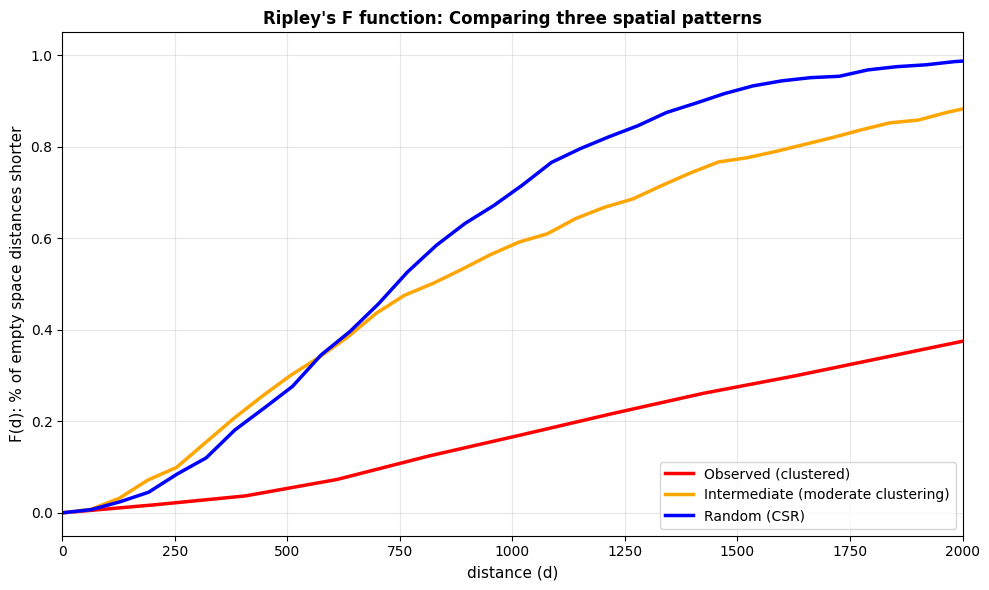

F function interpretation:
  - Clustered pattern: F rises slowly (large gaps between clusters)
  - Intermediate pattern: F rises at moderate speed (some gaps)
  - Random pattern: F rises quickly (no systematic gaps)


In [114]:
# Compute F function for all three patterns
f_observed = distance_statistics.f_test(
    coordinates, support=40, keep_simulations=False
)
f_intermediate = distance_statistics.f_test(
    intermediate_pattern, support=40, keep_simulations=False
)
f_random = distance_statistics.f_test(
    random_pattern, support=40, keep_simulations=False
)

# Create comparison plot
f_fig, ax = plt.subplots(1, 1, figsize=(10, 6))

# Plot all three F functions
ax.plot(f_observed.support, f_observed.statistic,
        label="Observed (clustered)", color="red", linewidth=2.5)
ax.plot(f_intermediate.support, f_intermediate.statistic,
        label="Intermediate (moderate clustering)", color="orange", linewidth=2.5)
ax.plot(f_random.support, f_random.statistic,
        label="Random (CSR)", color="blue", linewidth=2.5)

ax.set_xlabel("distance (d)", fontsize=11)
ax.set_ylabel("F(d): % of empty space distances shorter", fontsize=11)
ax.set_title("Ripley's F function: Comparing three spatial patterns", fontsize=12, fontweight='bold')
ax.legend(fontsize=10, loc='lower right')
ax.set_xlim(0, 2000)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("F function interpretation:")
print("  - Clustered pattern: F rises slowly (large gaps between clusters)")
print("  - Intermediate pattern: F rises at moderate speed (some gaps)")
print("  - Random pattern: F rises quickly (no systematic gaps)")

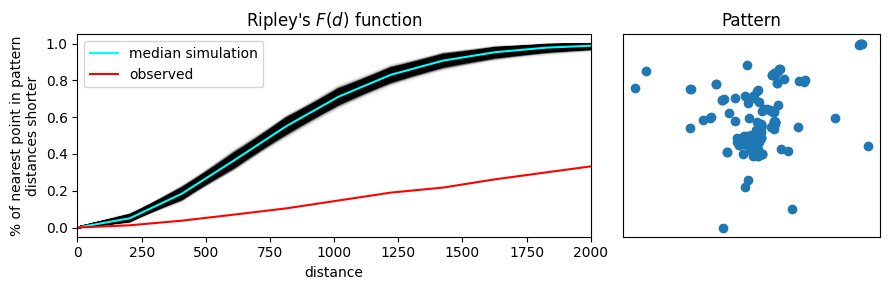

In [92]:
f, ax = plt.subplots(
    1, 2, figsize=(9, 3), gridspec_kw=dict(width_ratios=(6, 3))
)

# plot all the simulations with very fine lines
ax[0].plot(
    f_test.support, f_test.simulations.T, color="k", alpha=0.01
)
# and show the average of simulations
ax[0].plot(
    f_test.support,
    numpy.median(f_test.simulations, axis=0),
    color="cyan",
    label="median simulation",
)


# and the observed pattern's F function
ax[0].plot(
    f_test.support, f_test.statistic, label="observed", color="red"
)

# clean up labels and axes
ax[0].set_xlabel("distance")
ax[0].set_ylabel("% of nearest point in pattern\ndistances shorter")
ax[0].legend()
ax[0].set_xlim(0, 2000)
ax[0].set_title(r"Ripley's $F(d)$ function")

# plot the pattern itself on the next frame
ax[1].scatter(*coordinates.T)

# and clean up labels and axes there, too
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_xticklabels([])
ax[1].set_yticklabels([])
ax[1].set_title("Pattern")
f.tight_layout()
plt.show()

Ripley's "alphabet" extends to several other letter-named functions that can be used for conducting point pattern analysis in this vein. Good "next steps" in your point pattern analysis journey include the book by {cite}`Baddeley2015`, and the `pointpats` documentation for guidance on how to run these in Python.

### Ripley's K function

Beyond the $G$ and $F$ functions, Ripley's $K$ function provides another perspective on the clustering of point patterns. While the $G$ and $F$ functions focus on nearest neighbor distances and empty space distances respectively, the $K$ function considers all pairwise distances between points in a pattern. 

The $K$ function counts, for each point, how many other points lie within a given distance $d$. This cumulative count is then normalized by the overall intensity (density) of the point pattern. Unlike the $G$ and $F$ functions, which are empirical cumulative distribution functions, the $K$ function is an unnormalized count-based measure.

The interpretation of the $K$ function is intuitive: for a completely random point pattern, the expected value of $K(d)$ is $\pi d^2$ (the area of a circle with radius $d$). When observed $K(d)$ values exceed this expected value at certain distance ranges, it indicates clustering at those scales. Conversely, values below the expected line suggest regularity or dispersion at those distances.

Let's compute and visualize the $K$ function for our Flickr point pattern:

In [96]:
k_test = distance_statistics.k_test(
    coordinates, support=40, keep_simulations=True
)

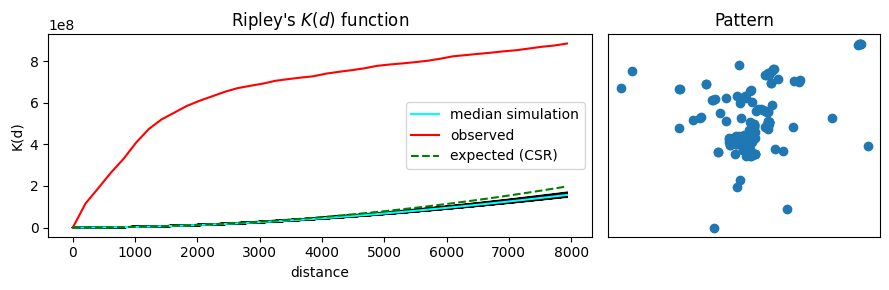

In [101]:
f, ax = plt.subplots(
    1, 2, figsize=(9, 3), gridspec_kw=dict(width_ratios=(6, 3))
)

# plot all the simulations with very fine lines
ax[0].plot(
    k_test.support, k_test.simulations.T, color="k", alpha=0.01
)
# and show the average of simulations
ax[0].plot(
    k_test.support,
    numpy.median(k_test.simulations, axis=0),
    color="cyan",
    label="median simulation",
)

# and the observed pattern's K function
ax[0].plot(
    k_test.support, k_test.statistic, label="observed", color="red"
)

# add the theoretical expectation for CSR
expected = numpy.pi * k_test.support ** 2
ax[0].plot(
    k_test.support, expected, label="expected (CSR)", color="green", linestyle="--"
)

# clean up labels and axes
ax[0].set_xlabel("distance")
ax[0].set_ylabel("K(d)")
ax[0].legend()
#ax[0].set_xlim(0, 2000)
ax[0].set_title(r"Ripley's $K(d)$ function")

# plot the pattern itself on the next frame
ax[1].scatter(*coordinates.T)

# and clean up labels and axes there, too
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_xticklabels([])
ax[1].set_yticklabels([])
ax[1].set_title("Pattern")
f.tight_layout()
plt.show()

In the above plot, the red curve shows the observed $K$ function for our data, which rises much faster than both the simulated patterns (blue band) and the theoretical expectation for complete spatial randomness (green dashed line). This confirms strong clustering at all distance scales. The observed $K(d)$ values exceed the expected values significantly, indicating that the Flickr photographs are much more clustered than would be expected from a random distribution.

A common alternative to the $K$ function is the $L$ function, which is defined as $L(d) = \sqrt{K(d)/\pi}$. The $L$ function is easier to interpret because, under the null hypothesis of complete spatial randomness, $L(d) = d$. Deviations from this line directly indicate clustering (when $L(d) > d$) or regularity (when $L(d) < d$):

#### Comparing L function across three patterns

Finally, let's compare the standardized L function across all three patterns:


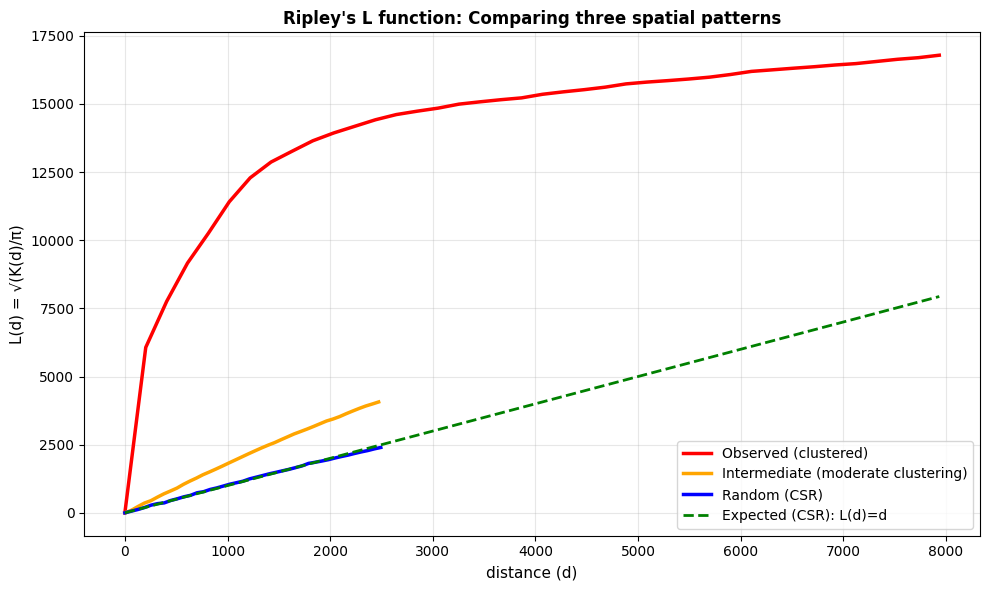

L function interpretation (easier to read than K):
  - When L(d) > d: clustering at distance d
  - When L(d) = d: random pattern (CSR)
  - When L(d) < d: regularity/dispersion at distance d

Observed in our data:
  - Red (clustered): L >> d at all scales → strong clustering
  - Orange (intermediate): L slightly > d → moderate clustering
  - Blue (random): L ≈ d → matches CSR expectation


In [116]:
# Compute L function for all three patterns
# L(d) = sqrt(K(d)/π)
l_observed = numpy.sqrt(k_observed.statistic / numpy.pi)
l_intermediate = numpy.sqrt(k_intermediate.statistic / numpy.pi)
l_random = numpy.sqrt(k_random.statistic / numpy.pi)

f, ax = plt.subplots(1, 1, figsize=(10, 6))

# Plot all three L functions
ax.plot(k_observed.support, l_observed,
        label="Observed (clustered)", color="red", linewidth=2.5)
ax.plot(k_intermediate.support, l_intermediate,
        label="Intermediate (moderate clustering)", color="orange", linewidth=2.5)
ax.plot(k_random.support, l_random,
        label="Random (CSR)", color="blue", linewidth=2.5)

# Add theoretical expectation for CSR (which is just d)
ax.plot(k_observed.support, k_observed.support, label="Expected (CSR): L(d)=d",
        color="green", linestyle="--", linewidth=2)

ax.set_xlabel("distance (d)", fontsize=11)
ax.set_ylabel("L(d) = √(K(d)/π)", fontsize=11)
ax.set_title("Ripley's L function: Comparing three spatial patterns", fontsize=12, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("L function interpretation (easier to read than K):")
print("  - When L(d) > d: clustering at distance d")
print("  - When L(d) = d: random pattern (CSR)")
print("  - When L(d) < d: regularity/dispersion at distance d")
print("\nObserved in our data:")
print("  - Red (clustered): L >> d at all scales → strong clustering")
print("  - Orange (intermediate): L slightly > d → moderate clustering")
print("  - Blue (random): L ≈ d → matches CSR expectation")

#### Comparing K function across three patterns

Let's compare the K function for the three patterns:


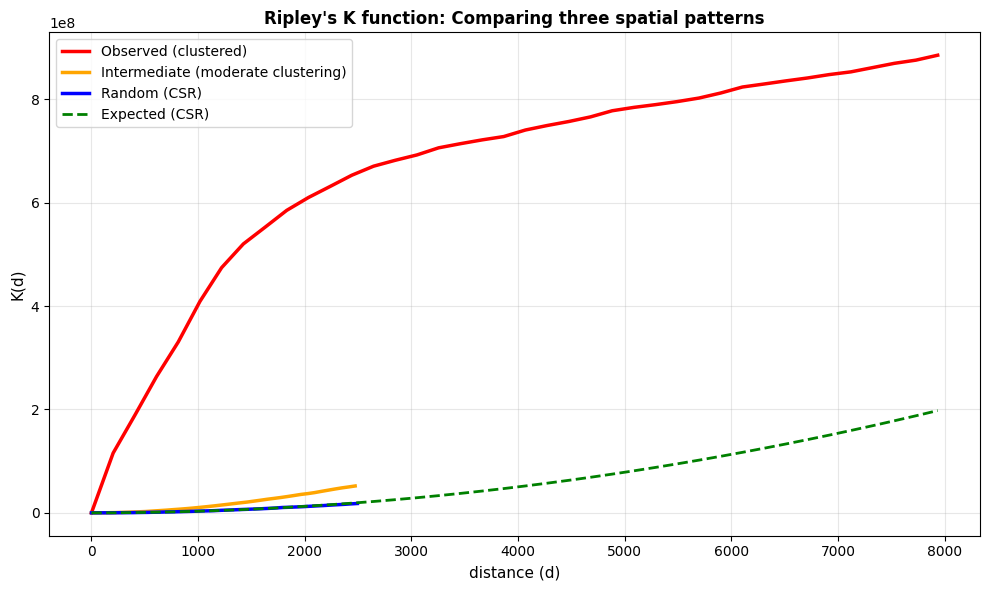

K function interpretation:
  - Clustered pattern: K >> expected (strong clustering at all scales)
  - Intermediate pattern: K slightly > expected (moderate clustering)
  - Random pattern: K ≈ expected (matches spatial randomness)


In [115]:
# Compute K function for all three patterns
k_observed = distance_statistics.k_test(
    coordinates, support=40, keep_simulations=False
)
k_intermediate = distance_statistics.k_test(
    intermediate_pattern, support=40, keep_simulations=False
)
k_random = distance_statistics.k_test(
    random_pattern, support=40, keep_simulations=False
)

# Create comparison plot
f, ax = plt.subplots(1, 1, figsize=(10, 6))

# Plot all three K functions
ax.plot(k_observed.support, k_observed.statistic,
        label="Observed (clustered)", color="red", linewidth=2.5)
ax.plot(k_intermediate.support, k_intermediate.statistic,
        label="Intermediate (moderate clustering)", color="orange", linewidth=2.5)
ax.plot(k_random.support, k_random.statistic,
        label="Random (CSR)", color="blue", linewidth=2.5)

# Add theoretical expectation for CSR
expected = numpy.pi * k_observed.support ** 2
ax.plot(k_observed.support, expected, label="Expected (CSR)", 
        color="green", linestyle="--", linewidth=2)

ax.set_xlabel("distance (d)", fontsize=11)
ax.set_ylabel("K(d)", fontsize=11)
ax.set_title("Ripley's K function: Comparing three spatial patterns", fontsize=12, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("K function interpretation:")
print("  - Clustered pattern: K >> expected (strong clustering at all scales)")
print("  - Intermediate pattern: K slightly > expected (moderate clustering)")
print("  - Random pattern: K ≈ expected (matches spatial randomness)")

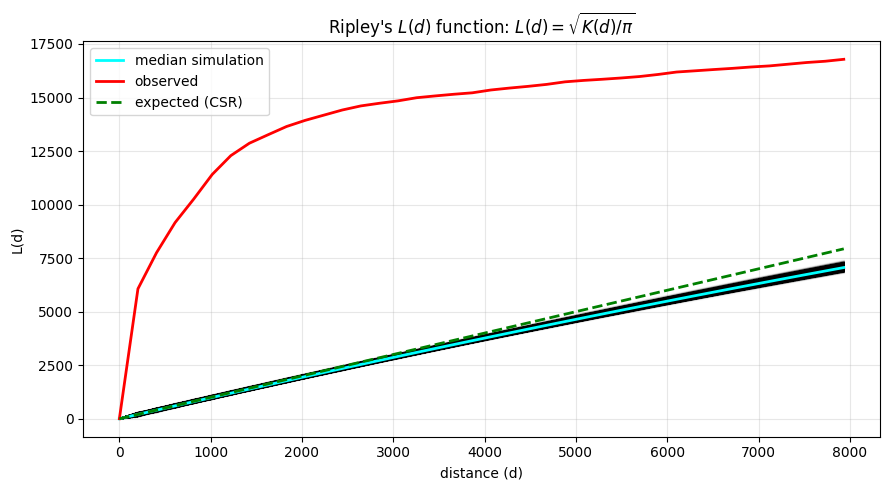

In [113]:
# Compute L function from K
k_observed = k_test.statistic
k_simulations = k_test.simulations
support = k_test.support

# L(d) = sqrt(K(d)/π)
l_observed = numpy.sqrt(k_observed / numpy.pi)
l_simulations = numpy.sqrt(k_simulations / numpy.pi)

f, ax = plt.subplots(1, figsize=(9, 5))

# plot all the simulations with very fine lines
ax.plot(
    support, l_simulations.T, color="k", alpha=0.01
)
# and show the average of simulations
ax.plot(
    support,
    numpy.median(l_simulations, axis=0),
    color="cyan",
    label="median simulation",
    linewidth=2
)

# and the observed pattern's L function
ax.plot(
    support, l_observed, label="observed", color="red", linewidth=2
)

# add the theoretical expectation for CSR (which is just d)
ax.plot(
    support, support, label="expected (CSR)", color="green", linestyle="--", linewidth=2
)

# fill the envelope between min and max simulations for reference
l_sim_min = numpy.percentile(l_simulations, 2.5, axis=0)
l_sim_max = numpy.percentile(l_simulations, 97.5, axis=0)
ax.fill_between(
    support, l_sim_min, l_sim_max, alpha=0.1, color="cyan"
)

# clean up labels and axes
ax.set_xlabel("distance (d)")
ax.set_ylabel("L(d)")
ax.legend()
#ax.set_xlim(0, 2000)
#ax.set_ylim(0, 500)
ax.set_title(r"Ripley's $L(d)$ function: $L(d) = \sqrt{K(d)/\pi}$")
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## Spatial Distribution Comparison Visualization

Compare three spatial distribution patterns side by side: clustered, intermediate, and completely random distributions.

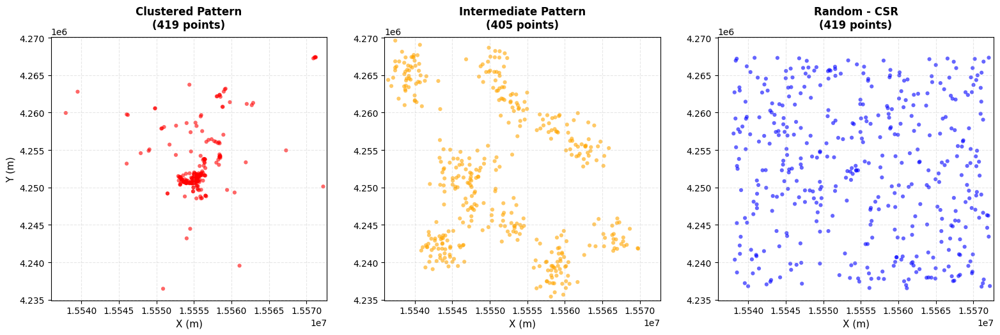

Clustered distribution: 419 points
Intermediate distribution: 405 points
Random distribution: 419 points


In [120]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np

# Create figure with 3 subplots side by side
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# Define patterns data
patterns = [
    (coordinates, 'Clustered Pattern', 'red'),
    (intermediate_pattern, 'Intermediate Pattern', 'orange'),
    (random_pattern, 'Random - CSR', 'blue')
]

# Get bounding box for consistent scaling
all_points = np.vstack([coordinates, intermediate_pattern, random_pattern])
xmin, ymin = all_points.min(axis=0)
xmax, ymax = all_points.max(axis=0)
margin = 500  # 500m margin

for ax, (points, title, color) in zip(axes, patterns):
    # Plot points
    ax.scatter(points[:, 0], points[:, 1], alpha=0.6, s=20, color=color, edgecolors='none')
    
    # Set consistent limits and labels
    ax.set_xlim(xmin - margin, xmax + margin)
    ax.set_ylim(ymin - margin, ymax + margin)
    ax.set_aspect('equal')
    ax.set_xlabel('X (m)', fontsize=11)
    if ax == axes[0]:
        ax.set_ylabel('Y (m)', fontsize=11)
    
    # Title with point count
    point_count = len(points)
    ax.set_title(f'{title}\n({point_count} points)', fontsize=12, fontweight='bold', pad=10)
    
    # Grid
    ax.grid(True, alpha=0.3, linestyle='--')

plt.tight_layout()
plt.savefig('three_patterns_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Clustered distribution: {len(coordinates)} points")
print(f"Intermediate distribution: {len(intermediate_pattern)} points")
print(f"Random distribution: {len(random_pattern)} points")

## Referenz
- Point Pattern Analysis — Geographic Data Science with Python (https://geographicdata.science/book/notebooks/08_point_pattern_analysis.html) - CC BY-NC-ND 4.0
- distance_statistics (https://pysal.org/notebooks/explore/pointpats/distance_statistics.html)